In [1]:
import pandas as pd

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
vdf = pd.read_csv('/content/drive/Shareddrives/QRLSSP 2024/COVID/Python Code/2020 Election Voting by County csv.csv')
vdf = vdf[~vdf['state'].isin(['alaska', 'hawaii'])]
vdf['name'] = vdf['name'].str.lower()
vdf['state'] = vdf['state'].str.lower()
vdf['name_state'] = vdf['name'] + '-' + vdf['state']
vdf['trumpd_votes_ratio'] = vdf['results_trumpd'] / vdf['votes']

In [ ]:
# Categorize counties into a1 to a5 based on Trump vote ratios
a1, a2, a3, a4, a5 = [], [], [], [], []

for _, row in vdf.iterrows():
    county = row['fips']
    ratio = row['trumpd_votes_ratio']
    if ratio <= 0.25:
        a1.append(county)
    elif 0.25 <= ratio < 0.45:
        a2.append(county)
    elif 0.45 <= ratio < 0.55:
        a3.append(county)
    elif 0.55 <= ratio < 0.75:
        a4.append(county)
    else:
        a5.append(county)

# Print counts of counties in each category
print("a1:", len(a1))
print("a2:", len(a2))
print("a3:", len(a3))
print("a4:", len(a4))
print("a5:", len(a5))
print("Total Counites:",len(a1)+len(a2)+len(a3)+len(a4)+len(a5))

a1: 62
a2: 355
a3: 330
a4: 1385
a5: 983
Total Counites: 3115


In [ ]:
qdf = pd.read_csv('/content/drive/Shareddrives/QRLSSP 2024/COVID/Python Code/us-counties-2021.csv')
qdf['county'] = qdf['county'].str.lower()
qdf['state'] = qdf['state'].str.lower()
qdf['county_state'] = qdf['county'] + '-' + qdf['state']
print("Total counties including Alaska and Hawaii after concatenating state & county US counites:", len(qdf['county_state'].unique()))
qdf['date'] = pd.to_datetime(qdf['date'], errors='coerce')

qdf = qdf.dropna(subset=['date'])

start_date = '2021-03-01'
end_date = '2021-09-01'

date_filtered_data = qdf[(qdf['date'] >= start_date) & (qdf['date'] <= end_date)]

Total counties including Alaska and Hawaii after concatenating state & county US counites: 3262


In [4]:
rdf = pd.read_csv('/content/drive/Shareddrives/QRLSSP 2024/COVID/Python Code/vaccinations-by-county.csv')
# Remove columns with unknowns CHECK THIS
rdf = rdf[~rdf['FIPS'].isin(['UNK'])]
rdf['FIPS'] = pd.to_numeric(rdf['FIPS'])
rdf = rdf.rename(columns={'FIPS': 'fips'})
rdf = rdf.rename(columns={'Series_Complete_Yes': 'vaccinations'})
rdf.reset_index(drop=True, inplace=True)

In [ ]:
date_filtered_data = pd.merge(date_filtered_data, rdf[['fips', 'vaccinations']], on='fips', how='left')

#Datewise cases and deaths in counties

In [ ]:
def create_category_df(fips_list):
    return date_filtered_data[date_filtered_data['fips'].isin(fips_list)][['fips','date', 'county', 'state', 'cases', 'deaths','vaccinations']].reset_index(drop=True)

# Create dataframes for each category
a1_df = create_category_df(a1)
a2_df = create_category_df(a2)
a3_df = create_category_df(a3)
a4_df = create_category_df(a4)
a5_df = create_category_df(a5)

# Print the first few rows of each dataframe to verify
print("a1_df:")
print(a1_df.head())
print("a2_df:")
print(a2_df.head())
print("a3_df:")
print(a3_df.head())
print("a4_df:")
print(a4_df.head())
print("a5_df:")
print(a5_df.head())

a1_df:
     fips       date   county       state  cases  deaths vaccinations
0  1011.0 2021-03-01  bullock     alabama   1169    36.0          416
1  1063.0 2021-03-01   greene     alabama    882    32.0          312
2  1087.0 2021-03-01    macon     alabama   1420    43.0        1,149
3  6001.0 2021-03-01  alameda  california  80798  1242.0      118,678
4  6041.0 2021-03-01    marin  california  13152   197.0       28,590
a2_df:
     fips       date      county    state  cases  deaths vaccinations
0  1047.0 2021-03-01      dallas  alabama   3403   141.0        1,407
1  1065.0 2021-03-01        hale  alabama   2105    68.0          845
2  1073.0 2021-03-01   jefferson  alabama  71073  1374.0       43,042
3  1085.0 2021-03-01     lowndes  alabama   1311    51.0          364
4  1101.0 2021-03-01  montgomery  alabama  22586   500.0       10,807
a3_df:
     fips       date   county    state  cases  deaths vaccinations
0  1005.0 2021-03-01  barbour  alabama   2116    51.0          965
1  10

In [ ]:
# Save the dataframes to CSV
a1_df.to_csv('a1_df.csv', index=False)
a2_df.to_csv('a2_df.csv', index=False)
a3_df.to_csv('a3_df.csv', index=False)
a4_df.to_csv('a4_df.csv', index=False)
a5_df.to_csv('a5_df.csv', index=False)

#Total cases and Deaths in counties

In [ ]:
# Function to create a summarized dataframe based on FIPS codes
def create_summarized_df(fips_list):
    filtered_data = date_filtered_data[date_filtered_data['fips'].isin(fips_list)]
    summarized_df = filtered_data.groupby(['fips', 'county', 'state', 'vaccinations']).agg({'cases': 'sum', 'deaths': 'sum'}).reset_index()
    summarized_df = summarized_df[['fips', 'county', 'state', 'cases', 'deaths', 'vaccinations']]
    return summarized_df

# Create summarized dataframes for each category
a1_summary_df = create_summarized_df(a1)
a2_summary_df = create_summarized_df(a2)
a3_summary_df = create_summarized_df(a3)
a4_summary_df = create_summarized_df(a4)
a5_summary_df = create_summarized_df(a5)

# Print the first few rows of each summarized dataframe to verify
print("a1_summary_df:")
print(a1_summary_df.head())
print("a2_summary_df:")
print(a2_summary_df.head())
print("a3_summary_df:")
print(a3_summary_df.head())
print("a4_summary_df:")
print(a4_summary_df.head())
print("a5_summary_df:")
print(a5_summary_df.head())

# Save the summarized dataframes to CSV if needed
a1_summary_df.to_csv('a1_summary_df.csv', index=False)
a2_summary_df.to_csv('a2_summary_df.csv', index=False)
a3_summary_df.to_csv('a3_summary_df.csv', index=False)
a4_summary_df.to_csv('a4_summary_df.csv', index=False)
a5_summary_df.to_csv('a5_summary_df.csv', index=False)


a1_summary_df:
     fips   county       state     cases    deaths vaccinations
0  1011.0  bullock     alabama    229768    7553.0          416
1  1063.0   greene     alabama    174907    6432.0          312
2  1087.0    macon     alabama    301594    9251.0        1,149
3  6001.0  alameda  california  16761172  256295.0      118,678
4  6041.0    marin  california   2643435   42206.0       28,590
a2_summary_df:
     fips      county    state     cases    deaths vaccinations
0  1047.0      dallas  alabama    672741   28661.0        1,407
1  1065.0        hale  alabama    420327   14133.0          845
2  1073.0   jefferson  alabama  14915649  283775.0       43,042
3  1085.0     lowndes  alabama    261861    9898.0          364
4  1101.0  montgomery  alabama   4641706  109807.0       10,807
a3_summary_df:
     fips   county    state    cases   deaths vaccinations
0  1005.0  barbour  alabama   440914  10760.0          965
1  1035.0  conecuh  alabama   214611   5412.0          754
2  1089.0 

#County Maps Insights based on categories

In [ ]:
!pip install geopandas
!pip install mapclassify

in below cell, just plotting the counties

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import mapclassify  # Added for quantiles scheme

# Step 1: Import the county shapefiles for the US as a GeoDataFrame
#/content/drive/Shareddrives/QRLSSP 2024/COVID/Python Code/shapfiles/shapfiles/cb_2023_us_cousub_500k.shp
#/content/drive/MyDrive/Colab Notebooks/shapfiles/cb_2023_us_cousub_500k.shp
shapefile_path = '/content/drive/Shareddrives/QRLSSP 2024/COVID/Python Code/shapfiles/shapfiles/cb_2023_us_cousub_500k.shp'
gdf_counties = gpd.read_file(shapefile_path)

# Step 2: Drop any counties outside the contiguous 48 states
contiguous_states = {'01', '04', '05', '06', '08', '09', '10', '12', '13', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '44', '45', '46', '47', '48', '49', '50', '51', '53', '54', '55', '56'}
gdf_counties = gdf_counties[gdf_counties['STATEFP'].isin(contiguous_states)]

# Ensure a copy of the DataFrame is being modified
gdf_counties = gdf_counties.copy()
gdf_counties['FIPS'] = gdf_counties['STATEFP'] + gdf_counties['COUNTYFP']

# Plotting
# fig, ax = plt.subplots(1, 1, figsize=(15, 10))
# gdf_counties.plot(column='FIPS', ax=ax, cmap='viridis')
# ax.set_title('US Counties by FIPS Code')
# ax.set_axis_off()
# plt.show()


In [ ]:
gdf_counties = gdf_counties.rename(columns={'FIPS': 'fips'})
gdf_counties['fips'] = gdf_counties['fips'].astype(int)

In [ ]:
print(gdf_counties.columns)

Index(['STATEFP', 'COUNTYFP', 'COUSUBFP', 'COUSUBNS', 'GEOIDFQ', 'GEOID',
       'NAME', 'NAMELSAD', 'STUSPS', 'NAMELSADCO', 'STATE_NAME', 'LSAD',
       'ALAND', 'AWATER', 'geometry', 'fips'],
      dtype='object')


In [ ]:
# Merge voting data with gdf_counties based on FIPS code
gdf_counties = gdf_counties.merge(vdf[['fips', 'trumpd_votes_ratio']], on='fips', how='left')

# Display the GeoDataFrame with added trumpd_votes_ratio column
print(gdf_counties.head())

  STATEFP COUNTYFP COUSUBFP  COUSUBNS              GEOIDFQ       GEOID  \
0      04      023    92295  01934961  0600000US0402392295  0402392295   
1      06      097    92460  01935251  0600000US0609792460  0609792460   
2      09      160    16050  00213410  0600000US0916016050  0916016050   
3      12      103    93042  01935922  0600000US1210393042  1210393042   
4      16      049    91334  01936724  0600000US1604991334  1604991334   

             NAME            NAMELSAD STUSPS                       NAMELSADCO  \
0         Nogales         Nogales CCD     AZ                Santa Cruz County   
1        Petaluma        Petaluma CCD     CA                    Sonoma County   
2       Colebrook      Colebrook town     CT  Northwest Hills Planning Region   
3  St. Petersburg  St. Petersburg CCD     FL                  Pinellas County   
4     Grangeville     Grangeville CCD     ID                     Idaho County   

    STATE_NAME LSAD       ALAND     AWATER  \
0      Arizona   22  1

#A1 to A5 : County Map

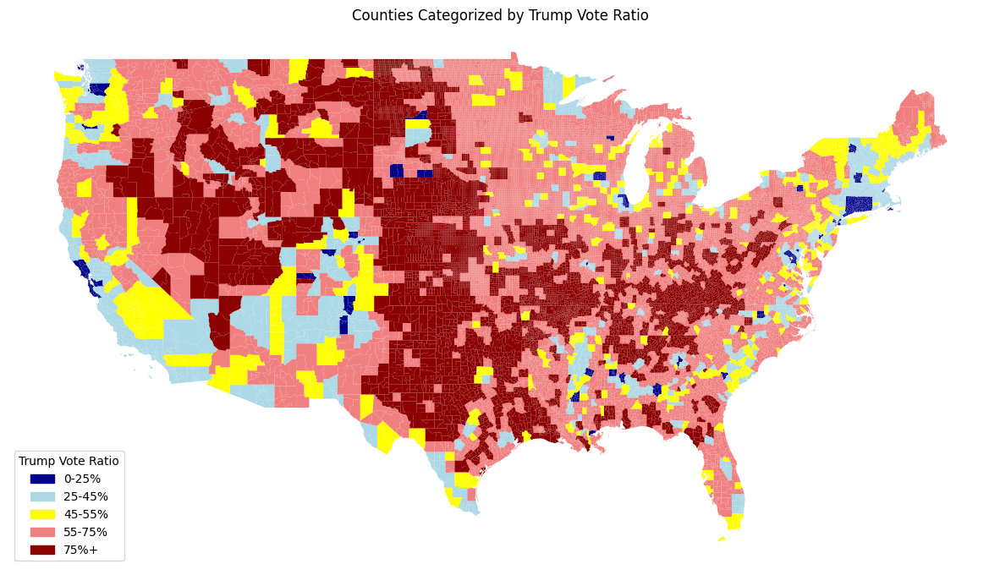

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Assuming gdf_counties is already merged with trumpd_votes_ratio from vdf
# Define categories based on trumpd_votes_ratio
gdf_counties['category'] = 'a1'  # Initialize with a5 (greater than 0.75)
gdf_counties.loc[gdf_counties['trumpd_votes_ratio'] >= 0.75, 'category'] = 'a5'
gdf_counties.loc[(gdf_counties['trumpd_votes_ratio'] >= 0.25) & (gdf_counties['trumpd_votes_ratio'] < 0.45), 'category'] = 'a2'
gdf_counties.loc[(gdf_counties['trumpd_votes_ratio'] >= 0.45) & (gdf_counties['trumpd_votes_ratio'] < 0.55), 'category'] = 'a3'
gdf_counties.loc[(gdf_counties['trumpd_votes_ratio'] >= 0.55) & (gdf_counties['trumpd_votes_ratio'] < 0.75), 'category'] = 'a4'

# Calculate counts for each category
category_counts = gdf_counties['category'].value_counts()

# Define colors for each category
colors = {
    'a1': 'darkblue',     # Extreme blue for less than 0.25
    'a2': 'lightblue',    # Less blue for 0.25-0.45
    'a3': '#FFFF00',      # Purple color for 0.45-0.55
    'a4': 'lightcoral',   # Light red for 0.55-0.75
    'a5': 'darkred'       # Extreme red for more than 0.75
}

# Plot counties with colors based on category
fig, ax = plt.subplots(1, 1, figsize=(15, 10))

for category, color in colors.items():
    gdf_counties[gdf_counties['category'] == category].plot(ax=ax, color=color, edgecolor='none')

# Add legend
legend_labels = {
    'a1': '0-25%',
    'a2': '25-45%',
    'a3': '45-55%',
    'a4': '55-75%',
    'a5': '75%+'
}
handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in colors.keys()]
ax.legend(handles, [legend_labels[label] for label in colors.keys()], loc='lower left', title='Trump Vote Ratio')

# Set plot title and display
ax.set_title('Counties Categorized by Trump Vote Ratio')
ax.set_axis_off()
plt.show()


In [ ]:
gdf_counties.columns


Index(['STATEFP', 'COUNTYFP', 'COUSUBFP', 'COUSUBNS', 'GEOIDFQ', 'GEOID',
       'NAME', 'NAMELSAD', 'STUSPS', 'NAMELSADCO', 'STATE_NAME', 'LSAD',
       'ALAND', 'AWATER', 'geometry', 'fips', 'trumpd_votes_ratio',
       'category'],
      dtype='object')

In [ ]:
cdf = pd.read_excel('/content/drive/Shareddrives/QRLSSP 2024/COVID/Python Code/filtered_PopulationEstimates.xlsx', skiprows=4)


new_df1 = cdf[~cdf['State'].str.endswith(('AK', 'HI'))].copy()

# Drop rows with missing values in 'State' column
new_df1 = new_df1.dropna(subset=['State'])

new_df2 = new_df1[['FIPStxt', 'POP_ESTIMATE_2021']]
new_df2.head()


,FIPStxt,POP_ESTIMATE_2021
0,0,332031554.0
1,1000,5049846.0
2,1001,59210.0
3,1003,239361.0
4,1005,24539.0


# A1 to A5 based on Cases, Deaths and Vaccines

In [ ]:

combined_summary_df = pd.concat([a1_summary_df, a2_summary_df, a3_summary_df, a4_summary_df, a5_summary_df], ignore_index=True)

# Save the combined DataFrame to CSV
combined_summary_df.to_csv('combined_summary_df.csv', index=False)


print(combined_summary_df.head())
print(len(combined_summary_df))

     fips   county       state     cases    deaths vaccinations
0  1011.0  bullock     alabama    229768    7553.0          416
1  1063.0   greene     alabama    174907    6432.0          312
2  1087.0    macon     alabama    301594    9251.0        1,149
3  6001.0  alameda  california  16761172  256295.0      118,678
4  6041.0    marin  california   2643435   42206.0       28,590
3100


In [ ]:
gdf_counties = gdf_counties.merge(combined_summary_df[['fips', 'cases', 'deaths', 'vaccinations']], on='fips', how='left')
gdf_counties.head()




,STATEFP,COUNTYFP,COUSUBFP,COUSUBNS,GEOIDFQ,GEOID,NAME,NAMELSAD,STUSPS,NAMELSADCO,...,LSAD,ALAND,AWATER,geometry,fips,trumpd_votes_ratio,category,cases,deaths,vaccinations
0,04,023,92295,01934961,0600000US0402392295,0402392295,Nogales,Nogales CCD,AZ,Santa Cruz County,...,22,1762339489,2382710,"POLYGON ((-111.36692 31.52136, -111.33572 31.5...",4023,0.316650,a2,1484332.0,32934.0,"4,324"
1,06,097,92460,01935251,0600000US0609792460,0609792460,Petaluma,Petaluma CCD,CA,Sonoma County,...,22,464973607,8198665,"POLYGON ((-122.83423 38.29242, -122.83358 38.2...",6097,0.230474,a1,5751928.0,59380.0,"40,397"
2,09,160,16050,00213410,0600000US0916016050,0916016050,Colebrook,Colebrook town,CT,Northwest Hills Planning Region,...,43,81722366,3551365,"POLYGON ((-73.14313 41.98862, -73.12901 42.036...",9160,NaN,a1,NaN,NaN,NaN
3,12,103,93042,01935922,0600000US1210393042,1210393042,St. Petersburg,St. Petersburg CCD,FL,Pinellas County,...,22,272910203,341516401,"MULTIPOLYGON (((-82.69547 27.66549, -82.69391 ...",12103,0.493482,a3,15160631.0,300331.0,"86,793"
4,16,049,91334,01936724,0600000US1604991334,1604991334,Grangeville,Grangeville CCD,ID,Idaho County,...,22,1610806612,5557016,"POLYGON ((-116.53961 45.74776, -116.53478 45.7...",16049,0.815039,a5,243331.0,3295.0,876


In [ ]:
gdf_counties['cases']

0         1484332.0
1         5751928.0
2               NaN
3        15160631.0
4          243331.0
            ...    
35316     1387165.0
35317      506420.0
35318      401043.0
35319     2882853.0
35320      676476.0
Name: cases, Length: 35321, dtype: float64

In [ ]:
current_type = type(gdf_counties['vaccinations'].iloc[0])

print(f"Current type of 'vaccinations' column: {current_type}")

Current type of 'vaccinations' column: <class 'str'>


In [ ]:
gdf_counties['vaccinations']

0         4,324
1        40,397
2           NaN
3        86,793
4           876
          ...  
35316     7,989
35317       196
35318     1,651
35319     7,934
35320       574
Name: vaccinations, Length: 35321, dtype: object

In [ ]:
gdf_counties['vaccinations'] = gdf_counties['vaccinations'].str.replace(',', '')

# Convert 'vaccinations' column to numeric
gdf_counties['vaccinations'] = pd.to_numeric(gdf_counties['vaccinations'], errors='coerce')


In [ ]:
#Handling missing values if needed
mean_cases = gdf_counties['cases'].mean()
mean_deaths = gdf_counties['deaths'].mean()
mean_vaccinations = gdf_counties['vaccinations'].mean()
# Fill NaN values in 'cases' column with the calculated mean
gdf_counties['cases'].fillna(mean_cases, inplace=True)
gdf_counties['deaths'].fillna(mean_deaths, inplace=True)
gdf_counties['vaccinations'].fillna(mean_vaccinations, inplace=True)

In [ ]:
# Ensure the FIPStxt column is of type string in new_df2
new_df2['FIPStxt'] = new_df2['FIPStxt'].astype(str)

# Ensure the fips column is of type string in gdf_counties
gdf_counties['fips'] = gdf_counties['fips'].astype(str)

# Perform the merge using the FIPS columns
gdf_counties = gdf_counties.merge(new_df2[['FIPStxt', 'POP_ESTIMATE_2021']], left_on='fips', right_on='FIPStxt', how='left')

# Drop the now unnecessary 'FIPStxt' column
gdf_counties.drop(columns=['FIPStxt'], inplace=True)

# Display the first few rows of the merged dataframe to verify the merge
print(gdf_counties.head())

  STATEFP COUNTYFP COUSUBFP  COUSUBNS              GEOIDFQ       GEOID  \
0      04      023    92295  01934961  0600000US0402392295  0402392295   
1      06      097    92460  01935251  0600000US0609792460  0609792460   
2      09      160    16050  00213410  0600000US0916016050  0916016050   
3      12      103    93042  01935922  0600000US1210393042  1210393042   
4      16      049    91334  01936724  0600000US1604991334  1604991334   

             NAME            NAMELSAD STUSPS                       NAMELSADCO  \
0         Nogales         Nogales CCD     AZ                Santa Cruz County   
1        Petaluma        Petaluma CCD     CA                    Sonoma County   
2       Colebrook      Colebrook town     CT  Northwest Hills Planning Region   
3  St. Petersburg  St. Petersburg CCD     FL                  Pinellas County   
4     Grangeville     Grangeville CCD     ID                     Idaho County   

   ...       ALAND     AWATER  \
0  ...  1762339489    2382710   
1 

<ipython-input-71-c7c434b63a34>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new_df2['FIPStxt'] = new_df2['FIPStxt'].astype(str)


<ipython-input-72-a7f168616ff1>:24: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ax.scatter(subset.geometry.centroid.x, subset.geometry.centroid.y, s=subset['c_size'], color=color, alpha=0.5, edgecolor='black')
<ipython-input-72-a7f168616ff1>:24: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ax.scatter(subset.geometry.centroid.x, subset.geometry.centroid.y, s=subset['c_size'], color=color, alpha=0.5, edgecolor='black')
<ipython-input-72-a7f168616ff1>:24: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ax.scatter(subset.geometry.centroid.x, subset.geometry.centroid.y, s=su

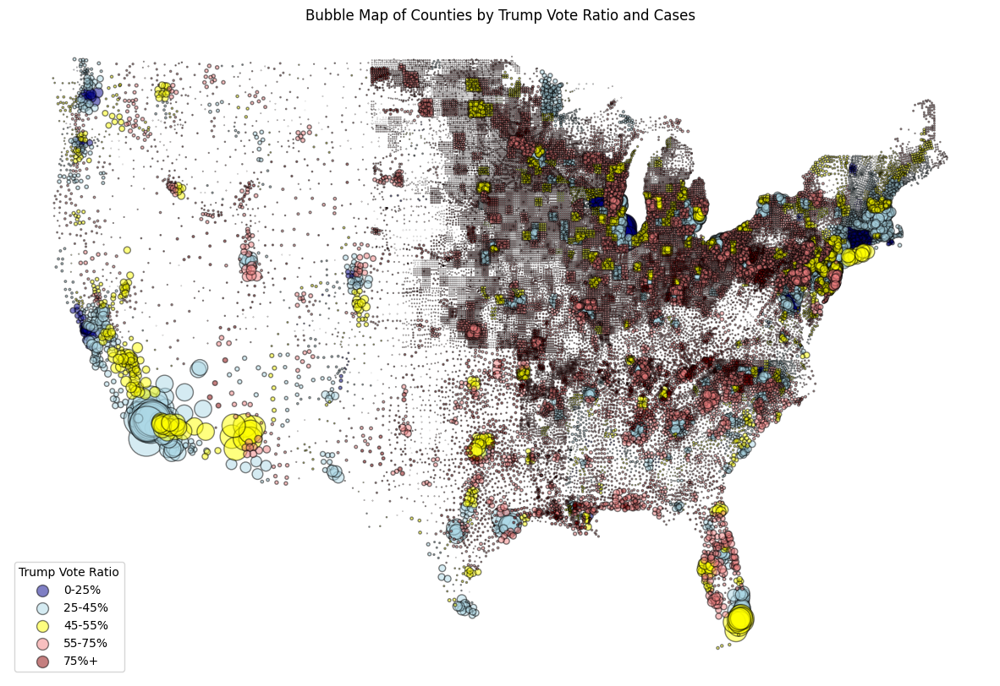

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Define colors for each category
colors = {
    'a1': 'darkblue',     # Extreme blue for less than 0.25
    'a2': 'lightblue',    # Less blue for 0.25-0.45
    'a3': '#FFFF00',      # Purple color for 0.45-0.55
    'a4': 'lightcoral',   # Light red for 0.55-0.75
    'a5': 'darkred'       # Extreme red for more than 0.75
}

# Define sizes based on cases
max_cases = gdf_counties['cases'].max()
min_cases = gdf_counties['cases'].min()
gdf_counties['c_size'] = 900 * (gdf_counties['cases'] - min_cases) / (max_cases - min_cases)  # Scale bubble size based on cases

# Plot counties with bubble sizes based on category and cases
fig, ax = plt.subplots(figsize=(15, 10))

# Plot counties with colors based on category
for category, color in colors.items():
    subset = gdf_counties[gdf_counties['category'] == category]
    ax.scatter(subset.geometry.centroid.x, subset.geometry.centroid.y, s=subset['c_size'], color=color, alpha=0.5, edgecolor='black')

# Add legend
legend_labels = {
    'a1': '0-25%',
    'a2': '25-45%',
    'a3': '45-55%',
    'a4': '55-75%',
    'a5': '75%+'
}
handles = [plt.scatter([], [], s=100, color=colors[label], edgecolor='black', alpha=0.5) for label in colors.keys()]
ax.legend(handles, [legend_labels[label] for label in colors.keys()], loc='lower left', title='Trump Vote Ratio')

# Set plot title and display
ax.set_title('Bubble Map of Counties by Trump Vote Ratio and Cases')
plt.axis('off')  # Turn off axis
plt.show()


<ipython-input-73-44e34c6f5dcc>:26: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ax.scatter(subset.geometry.centroid.x, subset.geometry.centroid.y, s=subset['c1_size'], color=color, alpha=0.6, edgecolor='none')
<ipython-input-73-44e34c6f5dcc>:26: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ax.scatter(subset.geometry.centroid.x, subset.geometry.centroid.y, s=subset['c1_size'], color=color, alpha=0.6, edgecolor='none')
<ipython-input-73-44e34c6f5dcc>:26: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ax.scatter(subset.geometry.centroid.x, subset.geometry.centroid.y, s=su

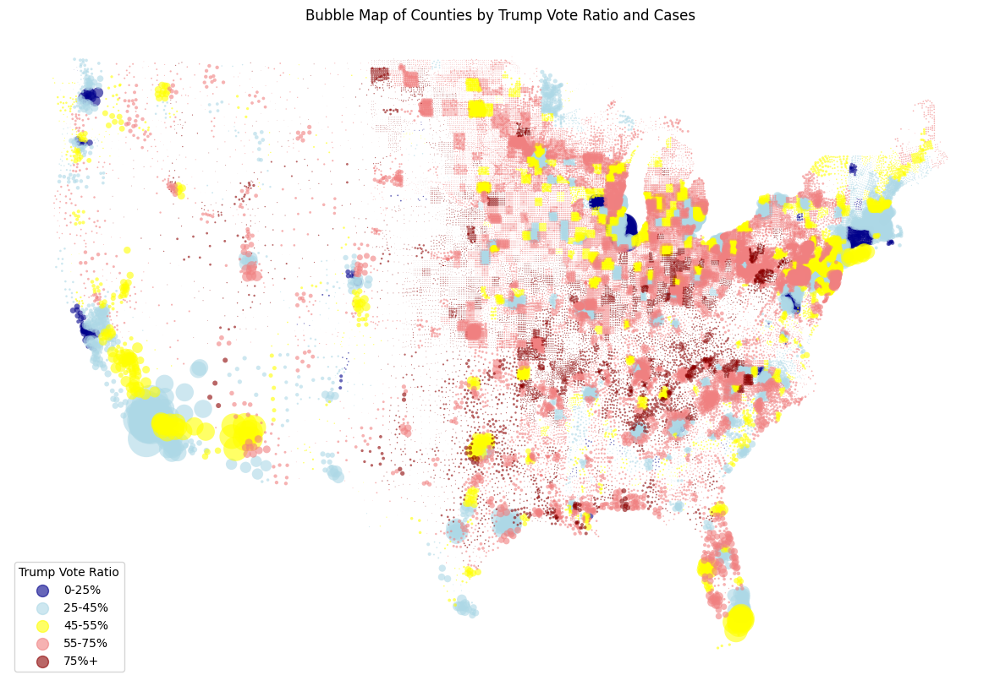

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Assuming gdf_counties is your GeoDataFrame with cases, category (a1 to a5), and geometry columns

# Define colors for each category
colors = {
    'a1': 'darkblue',     # Extreme blue for less than 0.25
    'a2': 'lightblue',    # Less blue for 0.25-0.45
    'a3': '#FFFF00',      # Yellow color for 0.45-0.55
    'a4': 'lightcoral',   # Light red for 0.55-0.75
    'a5': 'darkred'       # Extreme red for more than 0.75
}

# Define sizes based on cases
max_cases = gdf_counties['cases'].max()
min_cases = gdf_counties['cases'].min()
gdf_counties['c1_size'] = 1000 * (gdf_counties['cases'] - min_cases) / (max_cases - min_cases)  # Scale bubble size based on cases

# Plot counties with bubble sizes based on category and cases
fig, ax = plt.subplots(figsize=(15, 10))

# Plot counties with colors based on category
for category, color in colors.items():
    subset = gdf_counties[gdf_counties['category'] == category]
    ax.scatter(subset.geometry.centroid.x, subset.geometry.centroid.y, s=subset['c1_size'], color=color, alpha=0.6, edgecolor='none')

# Add legend
legend_labels = {
    'a1': '0-25%',
    'a2': '25-45%',
    'a3': '45-55%',
    'a4': '55-75%',
    'a5': '75%+'
}
handles = [plt.scatter([], [], s=100, color=colors[label], alpha=0.6) for label in colors.keys()]
ax.legend(handles, [legend_labels[label] for label in colors.keys()], loc='lower left', title='Trump Vote Ratio')

# Set plot title and display
ax.set_title('Bubble Map of Counties by Trump Vote Ratio and Cases')
plt.axis('off')  # Turn off axis
plt.show()


<ipython-input-74-e97faf9fb164>:11: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ax.scatter(subset.geometry.centroid.x, subset.geometry.centroid.y, s=subset['c2_size'], color=color, alpha=0.5, edgecolor='none', label=category)
<ipython-input-74-e97faf9fb164>:11: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ax.scatter(subset.geometry.centroid.x, subset.geometry.centroid.y, s=subset['c2_size'], color=color, alpha=0.5, edgecolor='none', label=category)
<ipython-input-74-e97faf9fb164>:11: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ax.scatter(subset.geometry.centroid.x, 

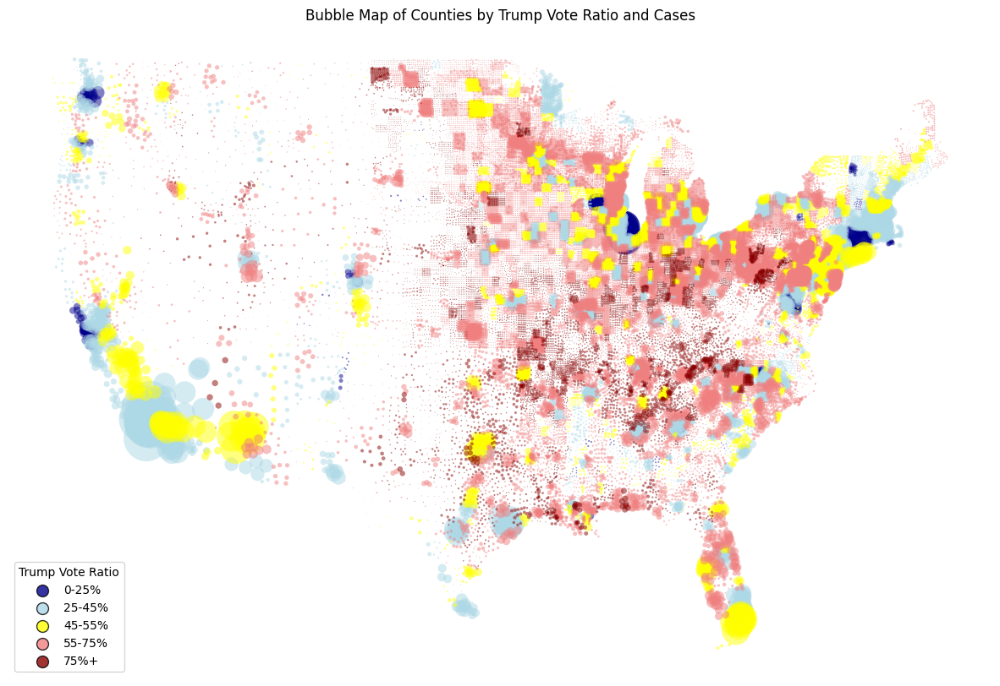

In [ ]:

gdf_counties['c2_size'] = 1500 * (gdf_counties['cases'] - min_cases) / (max_cases - min_cases)  # Scale bubble size based on cases



# Plot counties with bubbles based on category and size
fig, ax = plt.subplots(figsize=(15, 10))

# Plot counties with bubbles
for category, color in colors.items():
    subset = gdf_counties[gdf_counties['category'] == category]
    ax.scatter(subset.geometry.centroid.x, subset.geometry.centroid.y, s=subset['c2_size'], color=color, alpha=0.5, edgecolor='none', label=category)

handles = [plt.scatter([], [], s=100, color=colors[label], edgecolor='black', alpha=0.8) for label in colors.keys()]
ax.legend(handles, [legend_labels[label] for label in colors.keys()], loc='lower left', title='Trump Vote Ratio')

# Set plot title and display
ax.set_title('Bubble Map of Counties by Trump Vote Ratio and Cases')
plt.axis('off')  # Turn off axis
plt.show()


#Vaccinations

<ipython-input-75-37df70d94b21>:12: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ax.scatter(subset.geometry.centroid.x, subset.geometry.centroid.y, s=subset['v_size'], color=color, alpha=0.7, edgecolor='none', label=category)
<ipython-input-75-37df70d94b21>:12: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ax.scatter(subset.geometry.centroid.x, subset.geometry.centroid.y, s=subset['v_size'], color=color, alpha=0.7, edgecolor='none', label=category)
<ipython-input-75-37df70d94b21>:12: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ax.scatter(subset.geometry.centroid.x, su

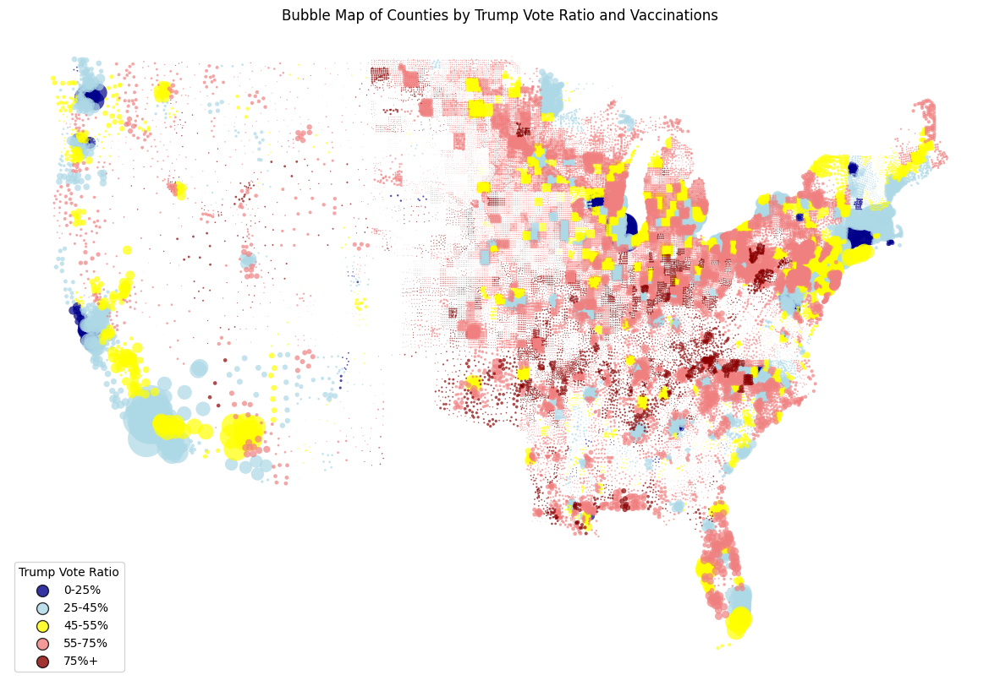

In [ ]:
max_vaccinations = gdf_counties['vaccinations'].max()
min_vaccinations = gdf_counties['vaccinations'].min()
gdf_counties['v_size'] = 1000 * (gdf_counties['vaccinations'] - min_vaccinations) / (max_vaccinations - min_vaccinations)


# Plot counties with bubbles based on category and size
fig, ax = plt.subplots(figsize=(15, 10))

# Plot counties with bubbles
for category, color in colors.items():
    subset = gdf_counties[gdf_counties['category'] == category]
    ax.scatter(subset.geometry.centroid.x, subset.geometry.centroid.y, s=subset['v_size'], color=color, alpha=0.7, edgecolor='none', label=category)

handles = [plt.scatter([], [], s=100, color=colors[label], edgecolor='black', alpha=0.8) for label in colors.keys()]
ax.legend(handles, [legend_labels[label] for label in colors.keys()], loc='lower left', title='Trump Vote Ratio')

# Set plot title and display
ax.set_title('Bubble Map of Counties by Trump Vote Ratio and Vaccinations')
plt.axis('off')  # Turn off axis
plt.show()


<ipython-input-76-46defc8566e6>:14: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  ax.scatter(gdf_counties.geometry.centroid.x, gdf_counties.geometry.centroid.y, s=gdf_counties['size'], color='blue', alpha=0.5, edgecolor='none')


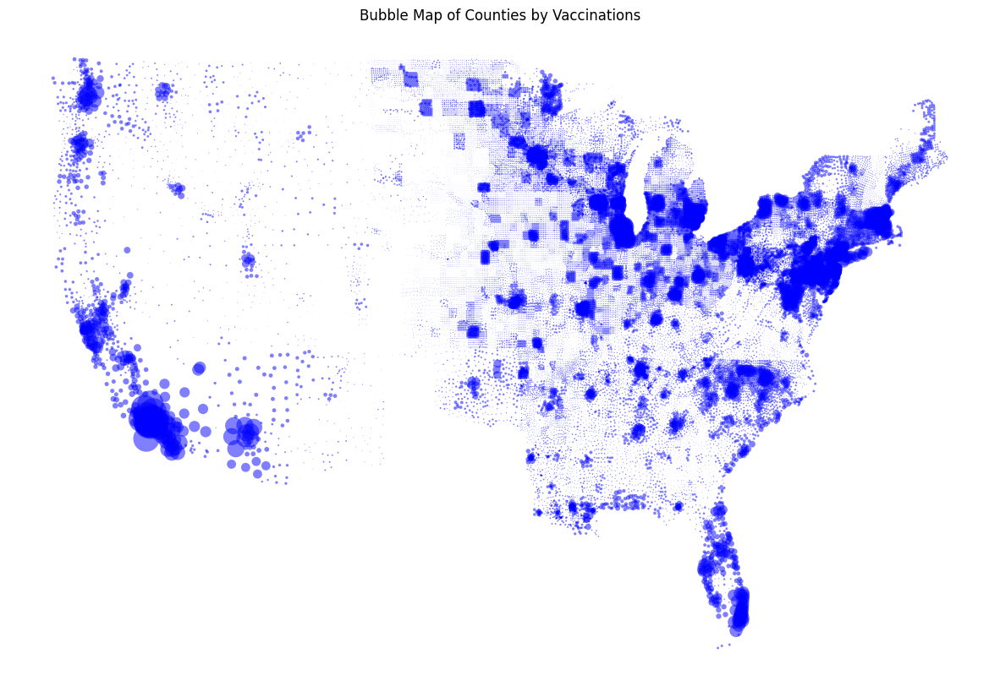

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Assuming gdf_counties is your GeoDataFrame with 'vaccinations' column
# Define sizes based on 'vaccinations' attribute
max_vaccinations = gdf_counties['vaccinations'].max()
min_vaccinations = gdf_counties['vaccinations'].min()
gdf_counties['size'] = 500 * (gdf_counties['vaccinations'] - min_vaccinations) / (max_vaccinations - min_vaccinations)

# Plot counties with bubbles based on vaccinations
fig, ax = plt.subplots(figsize=(15, 10))

# Plot counties with bubbles
ax.scatter(gdf_counties.geometry.centroid.x, gdf_counties.geometry.centroid.y, s=gdf_counties['size'], color='blue', alpha=0.5, edgecolor='none')

# Set plot title and display
ax.set_title('Bubble Map of Counties by Vaccinations')
plt.axis('off')  # Turn off axis
plt.show()


In [ ]:
min(gdf_counties['vaccinations'])

0.0

In [ ]:
# Counting null values in the 'vaccinations' column
null_count = gdf_counties['vaccinations'].isnull().sum()

print(f"Number of null values in 'vaccinations' column: {null_count}")

Number of null values in 'vaccinations' column: 0


In [ ]:
# Counting null values in the 'vaccinations' column
null_count1 = gdf_counties['cases'].isnull().sum()

print(f"Number of null values in 'cases' column: {null_count1}")

Number of null values in 'cases' column: 0


In [ ]:
len(gdf_counties)

35321

In [ ]:
len(gdf_counties['cases'])

35321

In [ ]:
gdf_counties

,STATEFP,COUNTYFP,COUSUBFP,COUSUBNS,GEOIDFQ,GEOID,NAME,NAMELSAD,STUSPS,NAMELSADCO,...,category,cases,deaths,vaccinations,POP_ESTIMATE_2021,c_size,c1_size,c2_size,v_size,size
0,04,023,92295,01934961,0600000US0402392295,0402392295,Nogales,Nogales CCD,AZ,Santa Cruz County,...,a2,1.484332e+06,32934.000000,4324.000000,48034.0,5.732298,6.369220,9.553830,5.687161,2.843581
1,06,097,92460,01935251,0600000US0609792460,0609792460,Petaluma,Petaluma CCD,CA,Sonoma County,...,a1,5.751928e+06,59380.000000,40397.000000,484315.0,22.217922,24.686580,37.029871,53.132345,26.566172
2,09,160,16050,00213410,0600000US0916016050,0916016050,Colebrook,Colebrook town,CT,Northwest Hills Planning Region,...,a1,2.532083e+06,46295.637257,9574.841134,112974.0,9.779735,10.866372,16.299558,12.593355,6.296677
3,12,103,93042,01935922,0600000US1210393042,1210393042,St. Petersburg,St. Petersburg CCD,FL,Pinellas County,...,a3,1.516063e+07,300331.000000,86793.000000,959046.0,58.563524,65.070582,97.605873,114.154903,57.077451
4,16,049,91334,01936724,0600000US1604991334,1604991334,Grangeville,Grangeville CCD,ID,Idaho County,...,a5,2.433310e+05,3295.000000,876.000000,17053.0,0.938340,1.042600,1.563900,1.152163,0.576082
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35316,18,177,06670,00453131,0600000US1817706670,1817706670,Boston,Boston township,IN,Wayne County,...,a4,1.387165e+06,37584.000000,7989.000000,66490.0,5.356944,5.952160,8.928241,10.507570,5.253785
35317,13,207,90822,01936206,0600000US1320790822,1320790822,Culloden-Bolingbroke,Culloden-Bolingbroke CCD,GA,Monroe County,...,a4,5.064200e+05,18714.000000,196.000000,28729.0,1.954647,2.171830,3.257745,0.257790,0.128895
35318,39,073,47740,01086321,0600000US3907347740,3907347740,Marion,Marion township,OH,Hocking County,...,a4,4.010430e+05,11224.000000,1651.000000,28126.0,1.547578,1.719531,2.579297,2.171486,1.085743
35319,27,171,49138,02396105,0600000US2717149138,2717149138,Otsego,Otsego city,MN,Wright County,...,a4,2.882853e+06,25902.000000,7934.000000,145143.0,11.134752,12.371947,18.557921,10.435231,5.217615


In [ ]:

# Assuming gdf_counties is your GeoDataFrame
gdf_counties.dropna(inplace=True)

In [ ]:
gdf_counties.columns

Index(['STATEFP', 'COUNTYFP', 'COUSUBFP', 'COUSUBNS', 'GEOIDFQ', 'GEOID',
       'NAME', 'NAMELSAD', 'STUSPS', 'NAMELSADCO', 'STATE_NAME', 'LSAD',
       'ALAND', 'AWATER', 'geometry', 'fips', 'trumpd_votes_ratio', 'category',
       'cases', 'deaths', 'vaccinations', 'POP_ESTIMATE_2021', 'c_size',
       'c1_size', 'c2_size', 'v_size', 'size'],
      dtype='object')

In [ ]:
gdf_counties.columns

Index(['STATEFP', 'COUNTYFP', 'COUSUBFP', 'COUSUBNS', 'GEOIDFQ', 'GEOID',
       'NAME', 'NAMELSAD', 'STUSPS', 'NAMELSADCO', 'STATE_NAME', 'LSAD',
       'ALAND', 'AWATER', 'geometry', 'fips', 'trumpd_votes_ratio', 'category',
       'cases', 'deaths', 'vaccinations', 'POP_ESTIMATE_2021', 'c_size',
       'c1_size', 'c2_size', 'v_size', 'size'],
      dtype='object')

In [ ]:
gdf_counties['cases']

0         1484332.0
1         5751928.0
3        15160631.0
4          243331.0
5         3063311.0
            ...    
35316     1387165.0
35317      506420.0
35318      401043.0
35319     2882853.0
35320      676476.0
Name: cases, Length: 35152, dtype: float64

In [ ]:
gdf_counties['case_rate_p']=(gdf_counties['cases']/gdf_counties['POP_ESTIMATE_2021'])

In [ ]:
gdf_counties['deaths_rate_p']=(gdf_counties['deaths']/gdf_counties['POP_ESTIMATE_2021'])*100

In [ ]:
gdf_counties['deaths_rate_p']

0        68.563934
1        12.260616
3        31.315599
4        19.322113
5        92.782078
           ...    
35316    56.525793
35317    65.139754
35318    39.906137
35319    17.845849
35320     8.052486
Name: deaths_rate_p, Length: 35152, dtype: float64

In [ ]:
gdf_counties['vac_rate_p']=(gdf_counties['vaccinations']/gdf_counties['POP_ESTIMATE_2021'])*100

In [ ]:
gdf_counties['vac_rate_p']

0         9.001957
1         8.341059
3         9.049931
4         5.136926
5        16.926065
           ...    
35316    12.015341
35317     0.682237
35318     5.870014
35319     5.466333
35320     0.747192
Name: vac_rate_p, Length: 35152, dtype: float64

In [ ]:
max(gdf_counties['deaths_rate_p'])

319.3022777886523

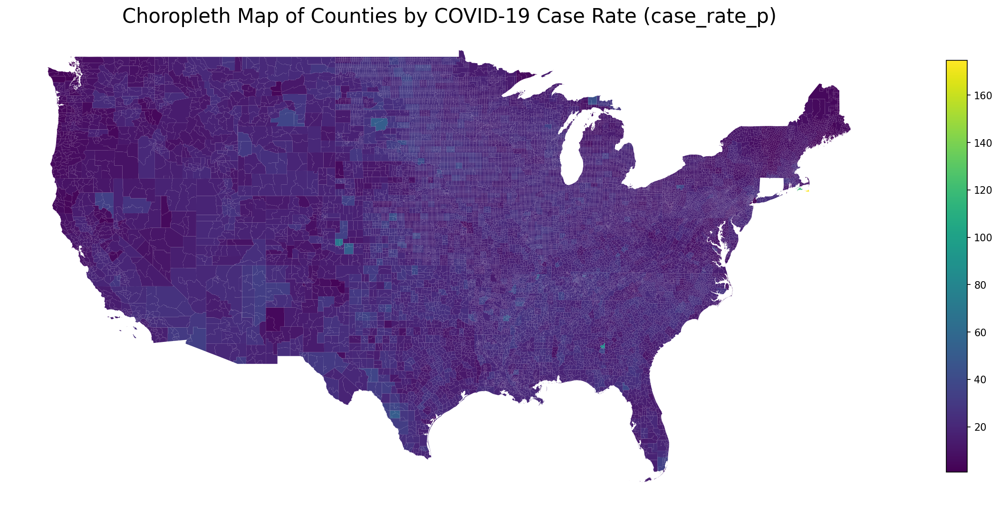

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Assuming gdf_counties is your GeoDataFrame with the 'case_rate_p' column

# Plot the choropleth map with 'case_rate_p' and clearer settings
fig, ax = plt.subplots(1, 1, figsize=(20, 15), dpi=150)
gdf_counties.plot(column='case_rate_p', cmap='viridis', linewidth=0.5, ax=ax, edgecolor='none', legend=True, legend_kwds={'shrink': 0.5})

# Set the title and remove the axes
ax.set_title('Choropleth Map of Counties by COVID-19 Case Rate (case_rate_p)', fontdict={'fontsize': 20, 'fontweight': 3})
ax.set_axis_off()

# Add a legend with a clearer color bar
sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=gdf_counties['case_rate_p'].min(), vmax=gdf_counties['case_rate_p'].max()))
sm._A = []

plt.show()


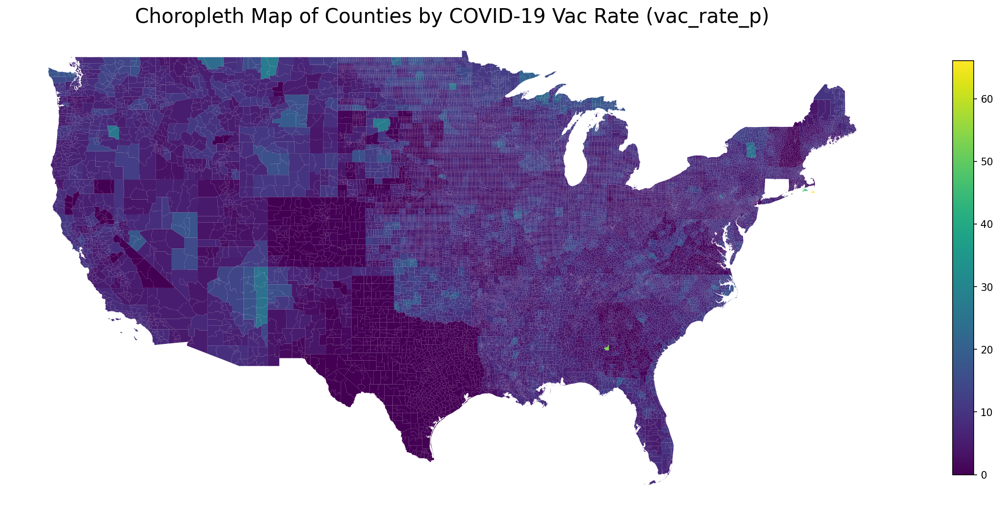

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Assuming gdf_counties is your GeoDataFrame with the 'case_rate_p' column

# Plot the choropleth map with 'case_rate_p' and clearer settings
fig, ax = plt.subplots(1, 1, figsize=(20, 15), dpi=150)
gdf_counties.plot(column='vac_rate_p', cmap='viridis', linewidth=0.5, ax=ax, edgecolor='none', legend=True, legend_kwds={'shrink': 0.5})

# Set the title and remove the axes
ax.set_title('Choropleth Map of Counties by COVID-19 Vac Rate (vac_rate_p)', fontdict={'fontsize': 20, 'fontweight': 3})
ax.set_axis_off()

# Add a legend with a clearer color bar
sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=gdf_counties['case_rate_p'].min(), vmax=gdf_counties['vac_rate_p'].max()))
sm._A = []

plt.show()


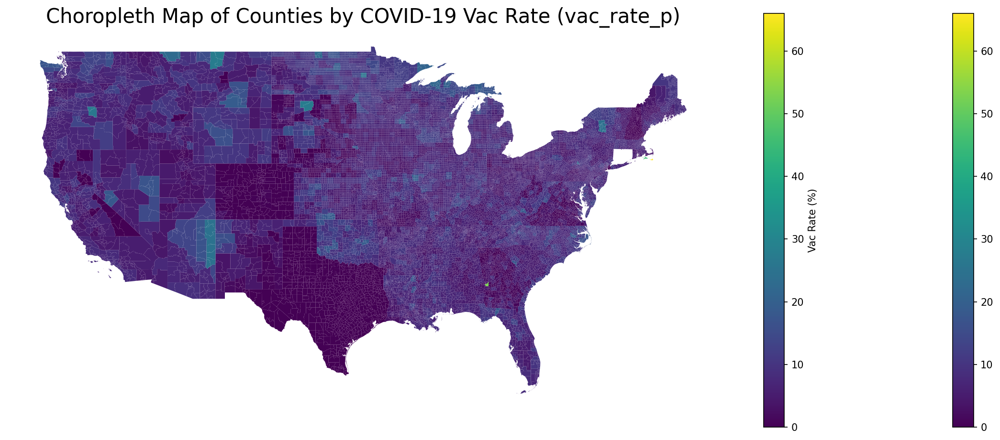

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Assuming gdf_counties is your GeoDataFrame with the 'vac_rate_p' column

# Plot the choropleth map with 'vac_rate_p' and clearer settings
fig, ax = plt.subplots(1, 1, figsize=(20, 15), dpi=150)
gdf_counties.plot(column='vac_rate_p', cmap='viridis', linewidth=0.5, ax=ax, edgecolor='none', legend=True, legend_kwds={'shrink': 0.5})

# Set the title and remove the axes
ax.set_title('Choropleth Map of Counties by COVID-19 Vac Rate (vac_rate_p)', fontdict={'fontsize': 20, 'fontweight': 3})
ax.set_axis_off()

# Get the current legend
legend = ax.get_legend()

# Check if legend exists and set title
if legend:
    legend.set_title('Vac Rate (%)')  # Set legend title

# Add a color bar with clear labeling
sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=gdf_counties['vac_rate_p'].min(), vmax=gdf_counties['vac_rate_p'].max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, orientation='vertical', shrink=0.5)
cbar.set_label('Vac Rate (%)')

plt.show()


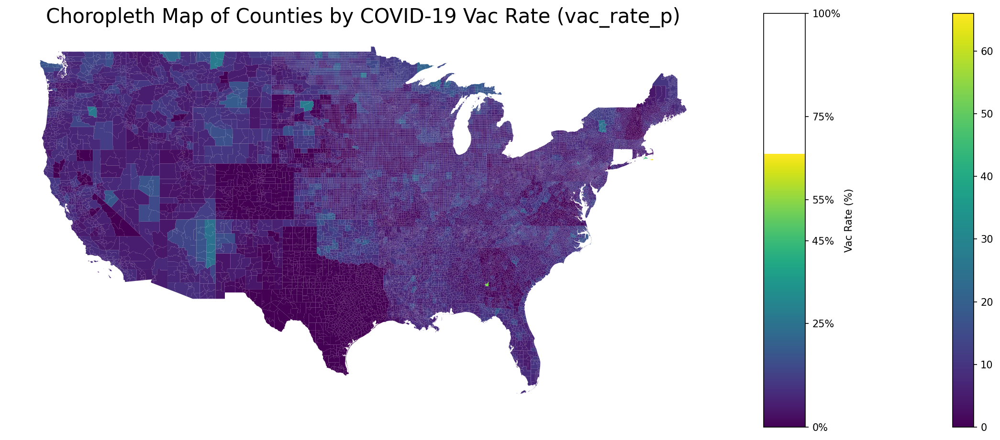

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Assuming gdf_counties is your GeoDataFrame with the 'vac_rate_p' column

# Plot the choropleth map with 'vac_rate_p' and clearer settings
fig, ax = plt.subplots(1, 1, figsize=(20, 15), dpi=150)
gdf_counties.plot(column='vac_rate_p', cmap='viridis', linewidth=0.5, ax=ax, edgecolor='none', legend=True, legend_kwds={'orientation': 'vertical', 'shrink': 0.5})

# Set the title and remove the axes
ax.set_title('Choropleth Map of Counties by COVID-19 Vac Rate (vac_rate_p)', fontdict={'fontsize': 20, 'fontweight': 3})
ax.set_axis_off()

# Add a color bar with clear labeling
sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=gdf_counties['vac_rate_p'].min(), vmax=gdf_counties['vac_rate_p'].max()))
sm._A = []
cbar = fig.colorbar(sm, ax=ax, orientation='vertical', shrink=0.5, aspect=10)
cbar.set_label('Vac Rate (%)')

# Customize the color bar ticks and labels
cbar.set_ticks([0, 25, 45, 55, 75, 100])  # Adjust based on your actual data range
cbar.set_ticklabels(['0%', '25%', '45%', '55%', '75%', '100%'])

plt.show()


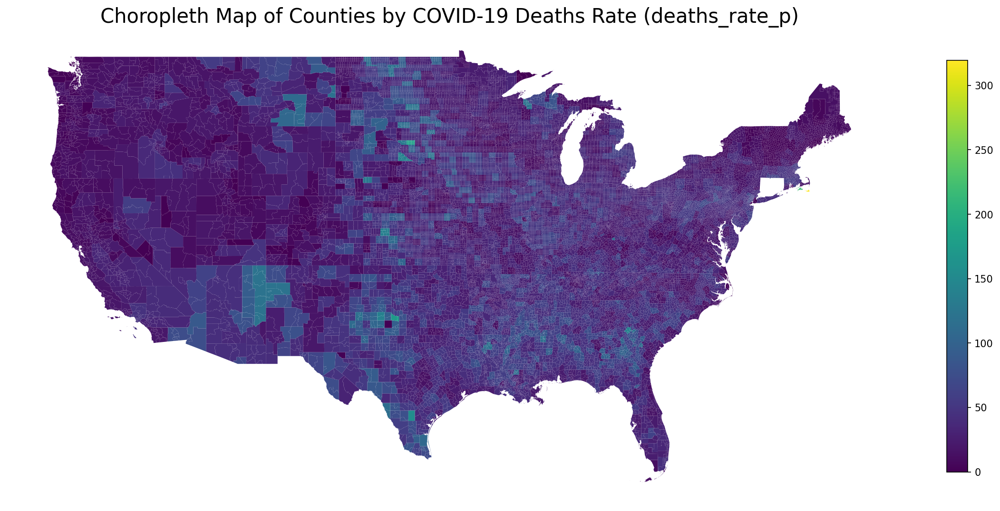

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt


fig, ax = plt.subplots(1, 1, figsize=(20, 15), dpi=150)
gdf_counties.plot(column='deaths_rate_p', cmap='viridis', linewidth=0.5, ax=ax, edgecolor='none', legend=True, legend_kwds={'shrink': 0.5})

# Set the title and remove the axes
ax.set_title('Choropleth Map of Counties by COVID-19 Deaths Rate (deaths_rate_p)', fontdict={'fontsize': 20, 'fontweight': 3})
ax.set_axis_off()

# Add a legend with a clearer color bar
sm = plt.cm.ScalarMappable(cmap='viridis', norm=plt.Normalize(vmin=gdf_counties['deaths_rate_p'].min(), vmax=gdf_counties['deaths_rate_p'].max()))
sm._A = []

plt.show()


In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Example data (replace with your actual GeoDataFrame and data)
gdf_counties = ...  # Your GeoDataFrame with 'category' and 'vaccination_rate' columns

# Ensure the geometries are Points
gdf_counties['geometry'] = gdf_counties['geometry'].centroid

# Define color map for categories
colors = {
    'a1': 'deepskyblue',    # Extreme Blue
    'a2': 'lightblue',      # Light Blue
    'a3': 'gold',           # Yellow
    'a4': 'lightsalmon',    # Light Red
    'a5': 'red'             # Extreme Red
}

# Define size scaling for bubble sizes (example scaling, adjust as needed)
min_size = 10
max_size = 1000

# Function to normalize sizes based on vaccination rates
def normalize_sizes(sizes):
    min_vaccine = gdf_counties['vac_rate_p'].min()
    max_vaccine = gdf_counties['vac_rate_p'].max()
    return min_size + (sizes - min_vaccine) * (max_size - min_size) / (max_vaccine - min_vaccine)

# Plotting
fig, ax = plt.subplots(figsize=(15, 10))

# Iterate through the categories and plot each one
for category, color in colors.items():
    subset = gdf_counties[gdf_counties['category'] == category]
    sizes = normalize_sizes(subset['vac_rate_p'])
    ax.scatter(subset.geometry.x, subset.geometry.y,
               s=sizes,
               c=color,
               label=category,
               edgecolor='k',
               alpha=0.6,
               linewidth=0.5)

# Custom legend
legend_handles = []
for category, color in colors.items():
    legend_handles.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=category))

ax.legend(handles=legend_handles, title='Categories', loc='upper right', fontsize='large')

# Optional: Adjust plot parameters (title, axis labels, etc.)
ax.set_title('Vaccination Rates by County', fontsize=20)
ax.set_xlabel('Longitude', fontsize=14)
ax.set_ylabel('Latitude', fontsize=14)
plt.tight_layout()

# Show plot
plt.show()


TypeError: 'ellipsis' object is not subscriptable

In [ ]:
gdf_counties.columns

AttributeError: 'ellipsis' object has no attribute 'columns'